# Exp: use DCGAN to generate faces from CelebA with PyTorch

In [5]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import animation as animation
import os
import argparse
from tqdm.notebook import tqdm

from IPython.display import HTML

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
# import torch.nn.parallel as parallel
import torch.backends.cudnn as cudnn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid

## Step1: load dataset

In [8]:
dataset_path = '/Users/strivin/Documents/University/Machine Learning/DataSet/CelebA/'
img_size = 64 # 64x64x3

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

dataset = ImageFolder(
    root = dataset_path,
    transform = transforms.Compose([
        transforms.Resize(img_size),
        transforms.CenterCrop(img_size),
        transforms.ToTensor(),
        transforms.Normalize([0.5,0.5,0.5],[0.5,0.5,0.5])
    ])
)

data_loader = DataLoader(dataset,batch_size=128,shuffle=True,num_workers=2)

In [24]:
print(len(dataset))
print(len(data_loader))

202599
1583


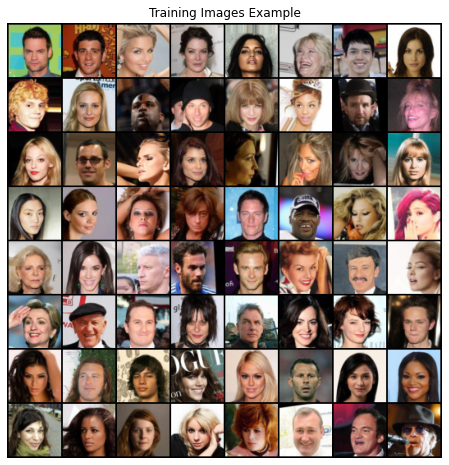

In [10]:
# show some train images
example_batch = next(iter(data_loader))
plt.figure(figsize=(8,8)) # 8x8 grid, 64 faces
plt.axis("off")
plt.title("Training Images Example")
plt.imshow(
     np.transpose(
         make_grid(example_batch[0].to(device)[:64],padding=2,normalize=True).cpu(),
         (1,2,0)
     ) # CWH => WHC
)

In [23]:
example_batch[0][0].shape

torch.Size([3, 64, 64])

## Step2: build model

In [25]:
class Generator(nn.Module):
    def __init__(self,dim_z,fmap_channel,img_channel):
        # :params
        # dim_z: the dimention of eigen vector z
        # fmap_channel: the channel of the last feature map
        # img_channel: the channel of the final generated image
        super(Generator,self).__init__()
        self.dim_z = dim_z
        
        # convT layer 1: dim_z x (1x1) => fmap_channel*8 x (4x4)
        self.convT1 = nn.ConvTranspose2d(
            in_channels=dim_z,out_channels=fmap_channel*8,kernel_size=4,stride=1,padding=0,bias=False)
        self.bn1 = nn.BatchNorm2d(fmap_channel*8)
        self.relu1 = nn.ReLU(inplace=True)
        # convT layer 2: fmap_channel*8 x (4x4) => fmap_channel*4 x (8x8)
        self.convT2 = nn.ConvTranspose2d(
            in_channels=fmap_channel*8,out_channels=fmap_channel*4,kernel_size=4,stride=2,padding=1,bias=False)
        self.bn2 = nn.BatchNorm2d(fmap_channel*4)
        self.relu2 = nn.ReLU(inplace=True)
        # convT layer 3: fmap_channel*4 x (8x8) => fmap_channel*2 x (16x16)
        self.convT3 = nn.ConvTranspose2d(
            in_channels=fmap_channel*4,out_channels=fmap_channel*2,kernel_size=4,stride=2,padding=1,bias=False)
        self.bn3 = nn.BatchNorm2d(fmap_channel*2)
        self.relu3 = nn.ReLU(inplace=True)
        # convT layer 4: fmap_channel*2 x (16x16) => fmap_channel x (32x32)
        self.convT4 = nn.ConvTranspose2d(
            in_channels=fmap_channel*2,out_channels=fmap_channel,kernel_size=4,stride=2,padding=1,bias=False)
        self.bn4 = nn.BatchNorm2d(fmap_channel)
        self.relu4 = nn.ReLU(inplace=True)
        
        # output layer: fmap_channel x (32x32) => img_channel x (64x64)
        self.convT5 = nn.ConvTranspose2d(
            in_channels=fmap_channel,out_channels=img_channel,kernel_size=4,stride=2,padding=1,bias=False)
        self.tanh = nn.Tanh() # image range: [-1,1]
    def forward(self,z):
        # convT layer 1: dim_z x (1x1) => fmap_channel*8 x (4x4)
        output = self.relu1(self.bn1(self.convT1(z)))
        # convT layer 2: fmap_channel*8 x (4x4) => fmap_channel*4 x (8x8)
        output = self.relu2(self.bn2(self.convT2(output)))
        # convT layer 3: fmap_channel*4 x (8x8) => fmap_channel*2 x (16x16)
        output = self.relu3(self.bn3(self.convT3(output)))
        # convT layer 4: fmap_channel*2 x (16x16) => fmap_channel x (32x32)
        output = self.relu4(self.bn4(self.convT4(output)))
        # output layer: fmap_channel x (32x32) => img_channel x (64x64)
        output = self.tanh(self.convT5(output))
        
        return output

In [26]:
dim_z = 100
fmap_channel = 64
img_channel = 3

generator = Generator(dim_z,fmap_channel,img_channel)
generator

Generator(
  (convT1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu1): ReLU(inplace=True)
  (convT2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu2): ReLU(inplace=True)
  (convT3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu3): ReLU(inplace=True)
  (convT4): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu4): ReLU(inplace=True)
  (convT5): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (tanh): Tanh()
)

In [13]:
class Discriminator(nn.Module):
    def __init__(self,img_channel,fmap_channel):
        # :params
        # img_channel: the channel of the input image
        # fmap_channel: the channel of the first feature map
        super(Discriminator,self).__init__()
        
        # conv layer 1: img_channel x (64x64) => fmap_channel x (32x32)
        self.conv1 = nn.Conv2d(
            in_channels=img_channel,out_channels=fmap_channel,kernel_size=4,stride=2,padding=1,bias=False
        )
        # self.bn1
        self.lrelu1 = nn.LeakyReLU(0.2,inplace=True)
        # conv layer 2: fmap_channel x (32x32) => fmap_channel*2 x (16x16)
        self.conv2 = nn.Conv2d(
            in_channels=fmap_channel,out_channels=fmap_channel*2,kernel_size=4,stride=2,padding=1,bias=False
        )
        self.bn2 = nn.BatchNorm2d(fmap_channel*2)
        self.lrelu2 = nn.LeakyReLU(0.2,inplace=True)
        # conv layer 3: fmap_channel*2 x (16x16) => fmap_channel*4 x (8x8)
        self.conv3 = nn.Conv2d(
            in_channels=fmap_channel*2,out_channels=fmap_channel*4,kernel_size=4,stride=2,padding=1,bias=False
        )
        self.bn3 = nn.BatchNorm2d(fmap_channel*4)
        self.lrelu3 = nn.LeakyReLU(0.2,inplace=True)
        # conv layer 4: fmap_channel*4 x (8x8) => fmap_channel*8 x (4x4)
        self.conv4 = nn.Conv2d(
            in_channels=fmap_channel*4,out_channels=fmap_channel*8,kernel_size=4,stride=2,padding=1,bias=False
        )
        self.bn4 = nn.BatchNorm2d(fmap_channel*8)
        self.lrelu4 = nn.LeakyReLU(0.2,inplace=True)
        # output layer: fmap_channel*8 x (4x4) => 1 x (1x1)
        self.conv5 = nn.Conv2d(
            in_channels=fmap_channel*8,out_channels=1,kernel_size=4,stride=1,padding=0,bias=False
        )
        self.sigmoid = nn.Sigmoid() # true image prob: [0,1]
    def forward(self,x):
        # conv layer 1: img_channel x (64x64) => fmap_channel x (32x32)
        output = self.lrelu1(self.conv1(x))
        # conv layer 2: fmap_channel x (32x32) => fmap_channel*2 x (16x16)
        output = self.lrelu2(self.bn2(self.conv2(output)))
        # conv layer 3: fmap_channel*2 x (16x16) => fmap_channel*4 x (8x8)
        output = self.lrelu3(self.bn3(self.conv3(output)))
        # conv layer 4: fmap_channel*4 x (8x8) => fmap_channel*8 x (4x4)
        output = self.lrelu4(self.bn4(self.conv4(output)))
        # output layer: fmap_channel*8 x (4x4) => 1 x (1x1)
        output = self.sigmoid(self.conv5(output))
        
        return output

In [14]:
discriminator = Discriminator(img_channel,fmap_channel)
discriminator

Discriminator(
  (conv1): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (lrelu1): LeakyReLU(negative_slope=0.2, inplace=True)
  (conv2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (lrelu2): LeakyReLU(negative_slope=0.2, inplace=True)
  (conv3): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (lrelu3): LeakyReLU(negative_slope=0.2, inplace=True)
  (conv4): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  (bn4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (lrelu4): LeakyReLU(negative_slope=0.2, inplace=True)
  (conv5): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  (sigmoid): Sigmoid()
)

In [46]:
class DCGAN():
    def __init__(self,G,D,lr=0.0001,beta1=0.5,device=None):
        self.device = device
        # model
        self.generator = G.to(device).apply(self._init_weight)
        self.discriminator = D.to(device).apply(self._init_weight)
        # loss_func
        self.loss_func = nn.BCELoss()
        # optimizer
        self.optimizerG = optim.Adam(self.generator.parameters(),lr=lr,betas=(beta1,0.999))
        self.optimizerD = optim.Adam(self.discriminator.parameters(),lr=lr,betas=(beta1,0.999))
    def fit(self,data_loader,epochs):
        # fixed eigen z noise to visualize generation process
        fixed_noise = torch.randn(64,self.generator.dim_z,1,1,device=self.device)
        # real and fake label
        real_label,fake_label = 1.,0.
        # log list
        losses_G,losses_D = [],[] 
        eval_imgs = []
        iters = 0
        
        for epoch in tqdm(range(1,epochs+1)):
            for i,data in enumerate(data_loader,0):
                # update discriminator
                fake_data,real_labels,Dx,DGz1,lossD = self._updateD(data,real_label,fake_label)
                # update generator
                DGz2,lossG = self._updateG(fake_data,real_labels)
                # log
                if i % 50 == 0:
                    print("Epoch {}/{} | iter {}/{} | loss D:{:3f}/G:{:3f} | output Dx:{:2f}/G1:{:2f}/G2:{:2f}"
                          .format(epoch,epochs,i,len(data_loader),lossD.item(),lossG.item(),Dx,DGz1,DGz2))
                losses_G.append(lossG.item())
                losses_D.append(lossD.item())
                # generate eval image
                if (iters % 500 == 0) or(
                    epoch == epochs and i == len(data_loader)-1
                ):
                    with torch.no_grad():
                        eval_img = self.generator(fixed_noise).detach().cpu()
                    eval_imgs.append(make_grid(eval_img,padding=2,normalize=True))
                
                iters += 1
        return losses_G,losses_D,eval_imgs
    def _updateD(self,data,real_label,fake_label):
        ## target to max: log(D(x)) + log(1-D(G(z)))
        self.discriminator.zero_grad()
        # real data training
        real_data = data[0].to(self.device)
        batch_size = real_data.size(0)
        real_labels = torch.full((batch_size,),real_label,device=self.device)
        real_output = self.discriminator(real_data).view(-1)
        real_loss = self.loss_func(real_output,real_labels)
        real_loss.backward()
        real_output_mean_D = real_output.mean().item() # mean of real output, should be from 1 to 0.5
        # fake data training
        noise = torch.randn(batch_size,self.generator.dim_z,1,1,device=self.device)
        fake_data = self.generator(noise)
        fake_labels = torch.full((batch_size,),fake_label,device=self.device)
        fake_output = self.discriminator(fake_data.detach()).view(-1) # detach, to avoid update G
        fake_loss = self.loss_func(fake_output,fake_labels)
        fake_loss.backward()
        fake_output_mean_G = fake_output.mean().item() # mean of fake output, should be from 1 to 0.5
        # loss combine
        loss = real_loss + fake_loss
        # optimize
        self.optimizerD.step()
        
        return fake_data,real_labels,real_output_mean_D,fake_output_mean_G,loss
    def _updateG(self,fake_data,real_labels):
        ## target to max: log(D(G(z))) instead of min:log(1-D(G(z)))
        self.generator.zero_grad()
        # forward
        output = self.discriminator(fake_data).view(-1)
        # backward
        loss = self.loss_func(output,real_labels)
        loss.backward()
        output_mean_G = output.mean().item() # mean of fake output, should be from 0 to 0.5
        # optimize
        self.optimizerG.step()
        
        return output_mean_G,loss
    def _init_weight(self,model):
        classname = model.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(model.weight.data,0.0,0.02) # mean = 0.0, std = 0.02
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(model.weight.data,1.0,0.02) # mean = 1.0, std = 0.02
            nn.init.constant_(model.bias.data,0) # bias = 0
    

In [47]:
learning_rate = 0.0002
epochs = 5

gan = DCGAN(generator,discriminator,lr=learning_rate,device=device)

## Step3: train model

In [48]:
losses_G,losses_D,eval_imgs = gan.fit(data_loader,epochs)

  0%|          | 0/5 [00:00<?, ?it/s]

Epoch 1/5 | iter 0/1583 | loss D:1.415926/G:4.088121 | output Dx:0.486087/G1:0.367031/G2:0.024377
Epoch 1/5 | iter 50/1583 | loss D:0.394021/G:29.783684 | output Dx:0.834637/G1:0.000000/G2:0.000000
Epoch 1/5 | iter 100/1583 | loss D:0.434162/G:5.833395 | output Dx:0.855196/G1:0.092567/G2:0.006764
Epoch 1/5 | iter 150/1583 | loss D:0.277393/G:3.708624 | output Dx:0.875814/G1:0.082744/G2:0.042029
Epoch 1/5 | iter 200/1583 | loss D:0.817852/G:6.493492 | output Dx:0.878670/G1:0.410371/G2:0.005852
Epoch 1/5 | iter 250/1583 | loss D:0.853512/G:7.302982 | output Dx:0.920693/G1:0.434159/G2:0.001331
Epoch 1/5 | iter 300/1583 | loss D:0.531759/G:4.744030 | output Dx:0.895175/G1:0.286086/G2:0.021550
Epoch 1/5 | iter 350/1583 | loss D:0.550034/G:5.435528 | output Dx:0.922274/G1:0.309132/G2:0.012601
Epoch 1/5 | iter 400/1583 | loss D:0.676038/G:2.733751 | output Dx:0.651840/G1:0.083070/G2:0.104456
Epoch 1/5 | iter 450/1583 | loss D:1.793287/G:8.321944 | output Dx:0.943616/G1:0.714157/G2:0.000913
Ep

Epoch 3/5 | iter 900/1583 | loss D:0.566546/G:1.785950 | output Dx:0.684840/G1:0.135360/G2:0.200236
Epoch 3/5 | iter 950/1583 | loss D:0.434307/G:2.490196 | output Dx:0.737129/G1:0.075141/G2:0.105368
Epoch 3/5 | iter 1000/1583 | loss D:0.911299/G:3.123417 | output Dx:0.877047/G1:0.477336/G2:0.060013
Epoch 3/5 | iter 1050/1583 | loss D:1.237605/G:3.511074 | output Dx:0.821971/G1:0.565367/G2:0.049534
Epoch 3/5 | iter 1100/1583 | loss D:0.773597/G:1.824268 | output Dx:0.595724/G1:0.129398/G2:0.216284
Epoch 3/5 | iter 1150/1583 | loss D:0.711913/G:1.958835 | output Dx:0.642570/G1:0.155099/G2:0.181500
Epoch 3/5 | iter 1200/1583 | loss D:0.630369/G:3.203020 | output Dx:0.858670/G1:0.350612/G2:0.053096
Epoch 3/5 | iter 1250/1583 | loss D:0.836305/G:3.117173 | output Dx:0.833416/G1:0.417669/G2:0.060577
Epoch 3/5 | iter 1300/1583 | loss D:0.760643/G:1.408828 | output Dx:0.572985/G1:0.069817/G2:0.296892
Epoch 3/5 | iter 1350/1583 | loss D:0.624022/G:2.025014 | output Dx:0.780093/G1:0.272793/G2:0

## Step4: show results

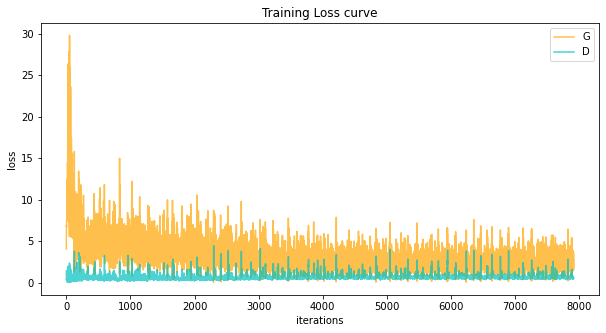

In [49]:
## loss curve
plt.figure(figsize=(10,5))
plt.title("Training Loss curve")
plt.plot(losses_G,c='orange',alpha=0.7,label="G")
plt.plot(losses_D,c='c',alpha=0.7,label="D")
plt.xlabel("iterations")
plt.ylabel("loss")
plt.legend()
plt.show()

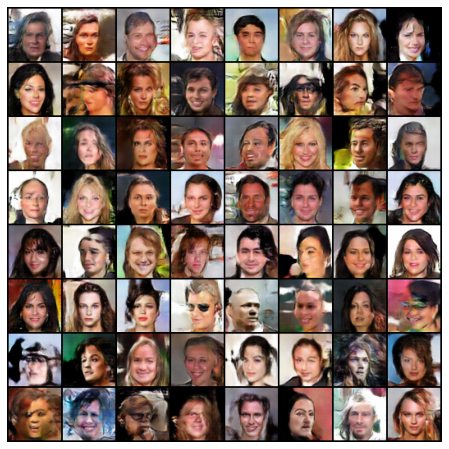

In [50]:
## eval generated images
fig = plt.figure(figsize=(8,8))
plt.axis("off")
imgs = [[plt.imshow(np.transpose(img,(1,2,0)),animated=True)] for img in eval_imgs]
ani = animation.ArtistAnimation(fig,imgs,interval=1000,repeat_delay=1000,blit=True)
HTML(ani.to_jshtml())

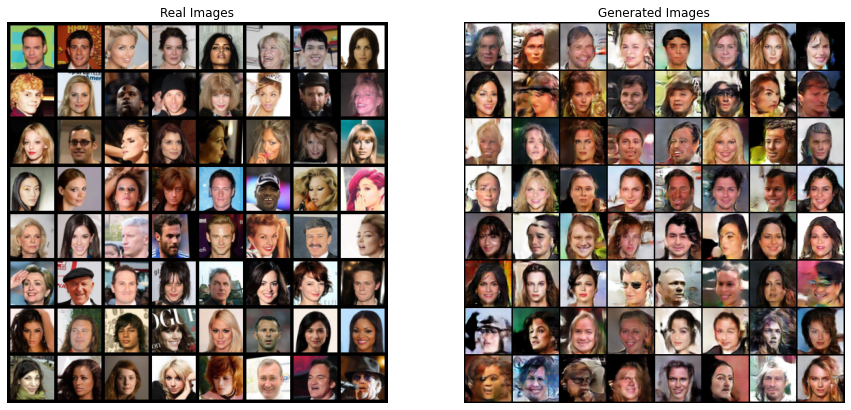

In [51]:
## real images and generated images
plt.figure(figsize=(15,15))
# real
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(make_grid(example_batch[0].to(device)[:64],padding=5,normalize=True).cpu(),(1,2,0)))
# generate
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(eval_imgs[-1],(1,2,0)))